# Training mit YOLOv5 

### Installation von YOLOv5 mit Git und pip

In [ ]:
!git clone "https://github.com/ultralytics/yolov5.git"
%cd yolov5
%pip install -qr requirements.txt
%cd ..

In [2]:
import torch
import wandb
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

### WandB-Integration
Wandb wurde während des Trainingsprozesses genutzt, um eine effektive Erfassung und Verfolgung der Metriken zu gewährleisten.  
Um das Training mit GPU-Unterstützung zu ermöglichen wurden folgende Paketversionen installiert:
- PyTorch: 1.9.0
- CUDA Toolkit: 11.1
- Torch: 1.9.0
- Torchvision: 0.10.0+cu111

In [13]:
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.9.0 _CudaDeviceProperties(name='NVIDIA GeForce RTX 3080', major=8, minor=6, total_memory=10239MB, multi_processor_count=68)


In [14]:
wandb.login()

True

In [3]:
%cd yolov5

c:\Users\Saniye\Documents\GitHub\Masc_Detection\YOLO\yolov5


#### Training von All_Classes und Face_Classes

Der All_Classes Dataset enthält 20 Klassen. Beim Training von All_Classes wird zunächst das Modell mit allen 20 Klassen trainiert. Anschließend erfolgt ein weiteres Training desselben Modells, jedoch ausschließlich mit den 4 Klassen aus "Face_Classes". Die anschließende Analyse und Bewertung basieren auf den erzielten Ergebnissen, wobei untersucht wird, warum ein Modell bessere Leistungen erzielt als das andere. 

Zunächst wurde ein Training über den Zeitraum von 100 Epochen durchgeführt, um den Konvergenzpunkt der Modelle zu analysieren und festzustellen, ab welchem Zeitpunkt optimale Ergebnisse erzielt wurden. Die Auswertung ergab, dass die Dauer von 20 Epochen bei beiden Modellen gute Ergebnisse erzielte. Die Trainingsparameter für beide Durchläufe waren identisch: 20 Epochen, eine Batch-Size von 5, Verwendung der "yolov5s.yaml" Konfigurationsdatei und Initialisierung mit den Gewichten aus "yolov5s.pt". Zusätzlich erfolgte das Training auf einem Bildformat von 640x640 Pixeln. Diese einheitlichen Einstellungen ermöglichen einen fairen und aussagekräftigen Vergleich der beiden Modelle.


**All_Classes:**
Enthaltene Klassen: ['face_no_mask', 'face_with_mask', 'mask_surgical', 'hat', 'eyeglasses', 'face_other_covering', 'face_with_mask_incorrect', 'mask_colorful', 'helmet', 'sunglasses', 'scarf_bandana', 'hair_net', 'goggles', 'face_shield', 'hijab_niqab', 'turban', 'balaclava_ski_mask', 'gas_mask', 'hood', 'other']


**Face_Classes:**
Enthaltene Klassen: ['face_no_mask', 'face_with_mask', 'face_other_covering', 'face_with_mask_incorrect']

In [ ]:
!python train.py --data ../dataset/all_classes/data.yaml --epochs 20 --cfg yolov5s.yaml --weights yolov5s.pt  --batch-size 5 --upload_dataset --bbox_interval 1 --img 640

In [ ]:
!python train.py --data ../dataset/face_classes/data.yaml --epochs 20 --cfg yolov5s.yaml --weights yolov5s.pt --batch-size 5 --upload_dataset --bbox_interval 1 --img 640

In [4]:
# Funktion zum Plotten von Bildern mit besserer Auflösung
def plot_high_resolution_png(image_path, dpi=300):

    img = mpimg.imread(image_path)

    # Bild plotten mit hoher Auflösung (angepasst an die DPI)
    plt.figure(dpi=dpi)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [5]:
# Funktion zum Plotten von Bildern nebeneinander
def show_images_side_by_side(image1_path, image2_path):
   
    img1 = mpimg.imread(image1_path)
    img2 = mpimg.imread(image2_path)

    # Erstelle das Subplot
    fig, axes = plt.subplots(1, 2, figsize=(30, 20))

    axes[0].imshow(img1, interpolation='bilinear')
    axes[0].axis('off')

    axes[1].imshow(img2, interpolation='bilinear')
    axes[1].axis('off')

    plt.show()

## Vergleich der Ergebnise des All_Classes und Face_Classes Modells

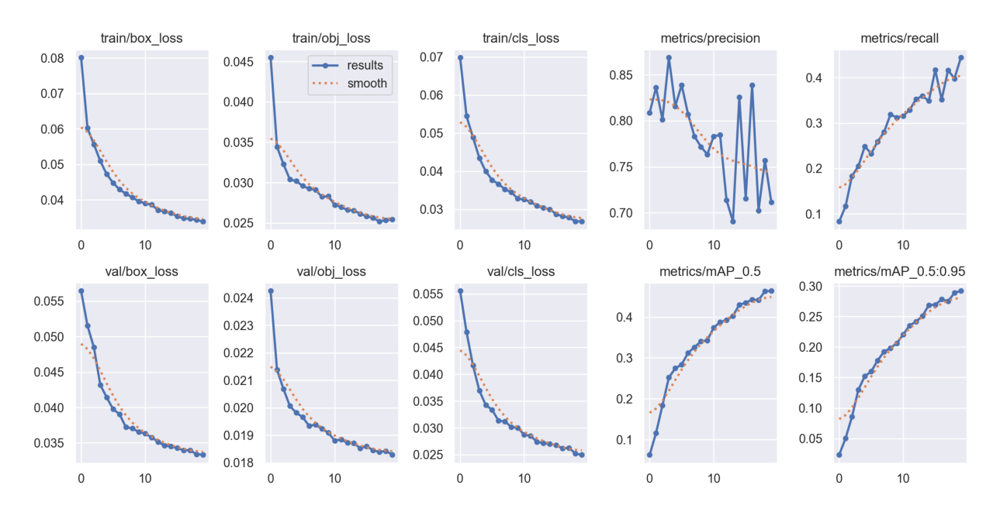

In [24]:
# Ergebnisse der Metriken für All_Classes
image_path = 'runs/train/yolov5_all_classes/results.png'
plot_high_resolution_png(image_path, dpi=250)

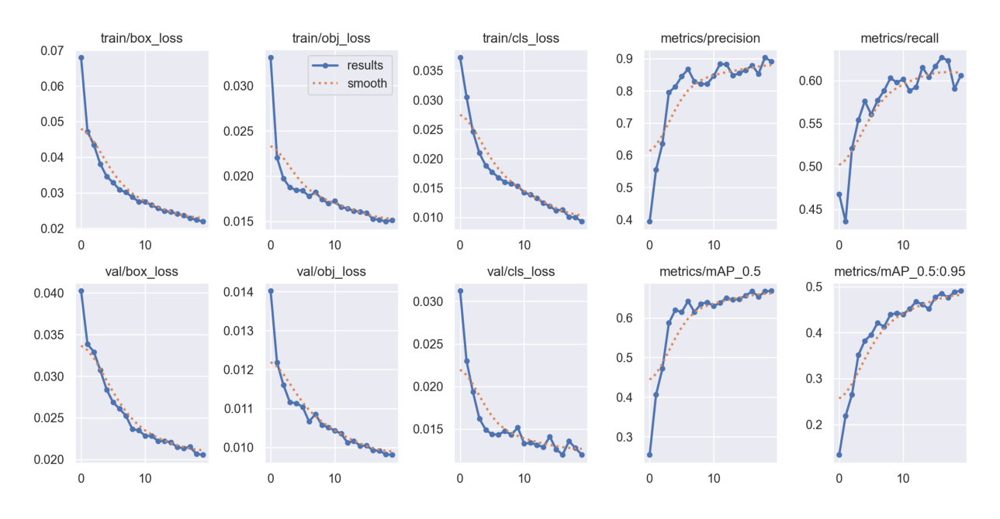

In [25]:
# Ergebnisse der Metriken für Face_Classes
image_path = 'runs/train/yolov5_face_classes/results.png'
plot_high_resolution_png(image_path, dpi=250)

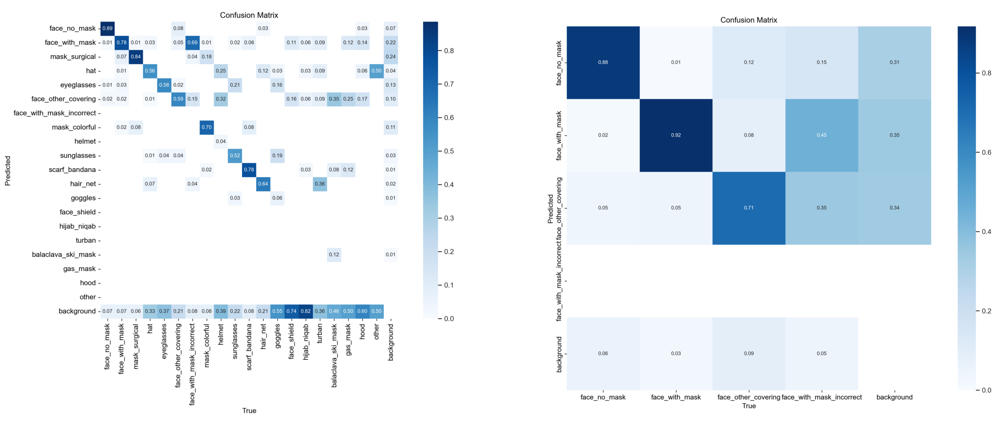

In [20]:
# Konfusionsmatrix
image_path_confusion_matrix1 = 'runs/train/yolov5_all_classes/confusion_matrix.png'
image_path_confusion_matrix2 = 'runs/train/yolov5_face_classes/confusion_matrix.png'
show_images_side_by_side(image_path_confusion_matrix1, image_path_confusion_matrix2)

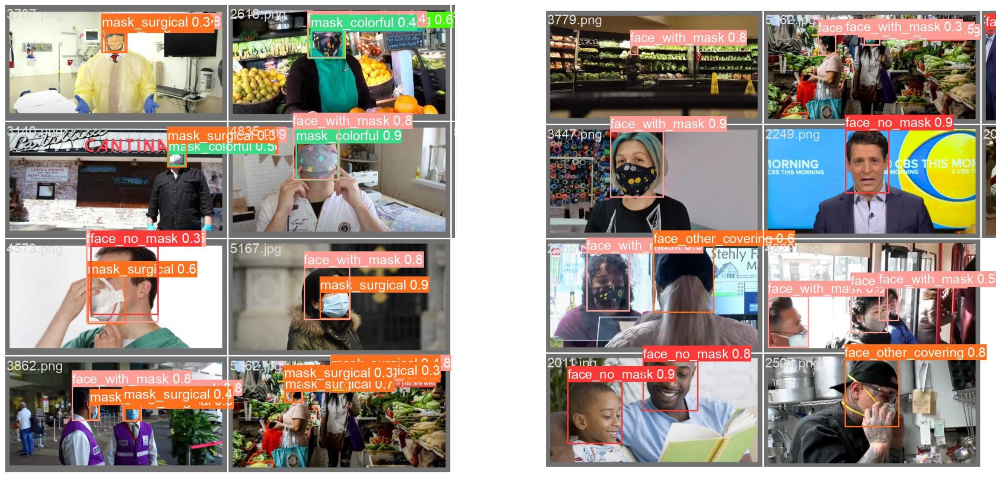

In [18]:
# Ergebnisse der Vorhersagen
image_path_pred1 = "runs/train/yolov5_all_classes/val_batch1.jpg"
image_path_pred2 = "runs/train/yolov5_face_classes/val_batch1.jpg"
show_images_side_by_side(image_path_pred1, image_path_pred2)

### Resultate:

| All_Classes  |  Prozent                |
|--------------|-------------------------|
| recall       | 0.44                    |
| precision    | 0.71                    |
| mAP_0.5      | 0.46                    |
| mAP_0.5:0.95 | 0.29                    |



| Face_Classes |   Prozent               |
|--------------|-------------------------|
| recall       | 0.60                    |
| precision    | 0.89                    |
| mAP_0.5      | 0.67                    |
| mAP_0.5:0.95 | 0.49                    |


### Fazit:
Bei den Resultaten beider YOLOv5-Modelle ist deutlich zu erkennen, dass das Modell mit dem Training auf den Face_Klassen bessere Leistung zeigt. Es zeigt höhere Werte in den Metriken Precision, Recall, mAP_0.5 und mAP_0.5:0.95 im Vergleich zum Modell, das mit den 20 Klassen trainiert wurde.

Die Konfusionsmatrix ermöglicht es uns, die tatsächlichen und vorhergesagten Klassen zu vergleichen. Auch hier zeigt sich, dass das Modell mit den 4 Face_Classes überlegen ist. Beim Training mit allen Klassen wurden einige Klassen überhaupt nicht vorhergesagt, was wahrscheinlich auf die begrenzte Datenverfügbarkeit für 20 Klassen zurückzuführen ist. Die Wahrscheinlichkeit, dass auch alle Klassen im Trainings- und Validierungsdatensatz vorhanden ist, ist wahrscheinlich auch gering. 

Auch beim Training mit den Face_Classes wird die Klasse "face_with_mask_incorrect" kaum vorhergesagt. Dies könnte wahrscheinlich darauf zurückzuführen sein, dass diese Klasse im Datensatz nicht häufig vertreten war. Dieses Verhalten lässt sich wahrscheinlich darauf zurückführen, dass diese spezifische Klasse nur selten im Datensatz vertreten war.

Zusammenfassend lässt sich sagen, dass das Training mit weniger Klassen zu einer verbesserten Leistung führt, insbesondere wenn ausreichend Daten für jede Klasse vorhanden sind. Es ist jedoch wichtig zu beachten, dass eine ausgewogene Datenrepräsentation entscheidend ist, um die Leistung des Modells zu optimieren.

## Einzel-Person Training

In diesem speziellen Training wurden ausschließlich Einzelpersonen und die Face_Classes berücksichtigt, da diese Kombination zuvor die besten Ergebnisse erzielt hat, wie bereits oben beschrieben. Das Ziel dieses Trainings ist es zu untersuchen, ob das Training ausschließlich auf Einzelpersonen bessere Ergebnisse liefert im Vergleich zu einem Training, das sowohl Einzelpersonen als auch Gruppen von Personen umfasst, wie es im Modell der Face_Classes der Fall war.

Auch in diesem Fall wurde ein Training über einen Zeitraum von 100 Epochen durchgeführt, um den Konvergenzpunkt der Modelle zu analysieren und festzustellen, ab welchem Zeitpunkt optimale Ergebnisse erzielt wurden. Die Auswertung ergab, dass die Dauer von 35 Epochen gute Ergebnisse erzielte. Die Trainingsparameter entsprechen denen des Trainings für die All_Classes und Face_Classes Modelle, mit einer identischen Einstellung von 35 Epochen.

In [ ]:
!python train.py --data ../dataset/single_person/data.yaml --epochs 35 --cfg yolov5s.yaml --weights yolov5s.pt --batch-size 5 --upload_dataset --bbox_interval 1 --img 640

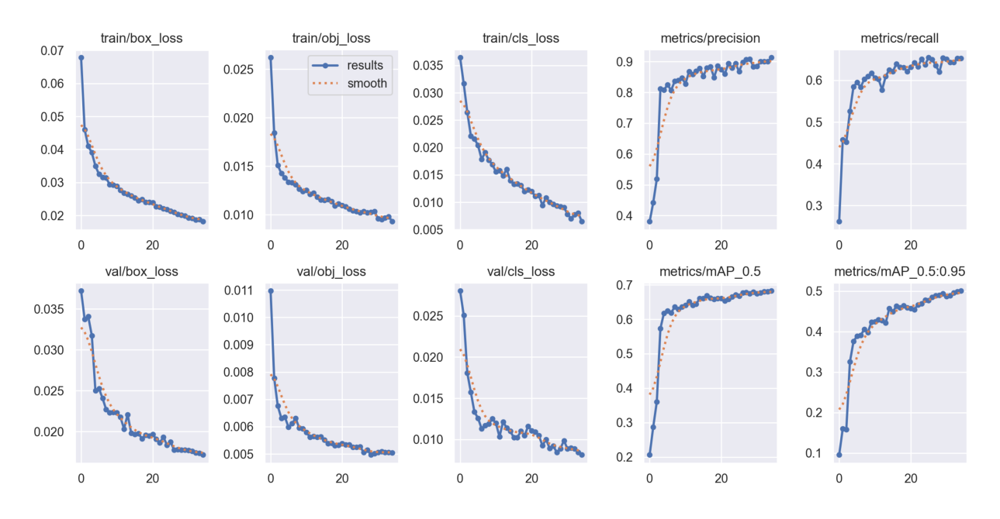

In [27]:
# Ergebnisse der Metriken
image_path = "runs/train/yolov5_single_person/results.png"
plot_high_resolution_png(image_path, dpi=250)

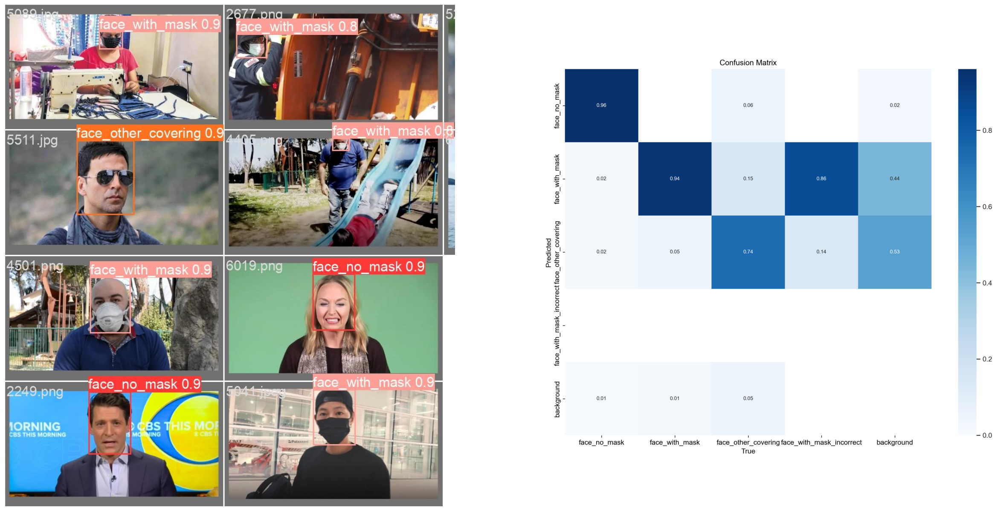

In [32]:
# Ergebnisse der Vorhersagen und Konfusionsmatrix
image_path_pred = "runs/train/yolov5_single_person/val_batch1.jpg"
image_path_conf = "runs/train/yolov5_single_person/confusion_matrix.png"
show_images_side_by_side(image_path_pred, image_path_conf)

### Resultate:

| Single_Person |  Prozent                |
|---------------|-------------------------|
| recall        | 0.65                    |
| precision     | 0.69                    |
| mAP_0.5       | 0.68                    |
| mAP_0.5:0.95  | 0.50                    |

#### Fazit:

Die Ergebnisse des Trainings auf den 4 Face_Classes, insbesondere bei der Betrachtung einzelner Gesichter, zeigen die besten Werte unter den drei YOLOv5-Modellen. Dies lässt sich mit hoher Wahrscheinlichkeit darauf zurückführen, dass das Modell speziell auf die 4 Gesichtsklassen und Einzelpersonen ausgerichtet ist. Dieser Fokus ermöglicht eine Vereinfachung der Aufgabe, da keine Überlappungen mit anderen Klassen auftreten. Das Modell wird gezielt auf die Merkmale und Eigenschaften dieser Gesichtsklassen trainiert, was zu den verbesserten Recall-, Precision- und mAP_0.5-Werten führt.

## Training mit einem Datensatz unter schlechten Lichtverhältnissen

Das Hauptziel des Trainings auf einem Datensatz unter schlechten Lichtverhältnissen bestand darin, die Fähigkeit eines Modells zu stärken, Masken auch bei Nacht und ungünstigen Lichtbedingungen zuverlässig zu erkennen. Für dieses Training wurde ein Datensatz von Kaggle verwendet. Durch gezielte Augmentationstechniken wurde der Datensatz gezielt abgedunkelt. In diesem Szenario wurden ausschließlich drei Klassen berücksichtigt: ["without_mask", "with_mask", "mask_worn_incorrectly"].

*Hinweis: Die Details zur Datenvorbereitung sind im Notebook "Datenvorbereitung_YOLOv5.iypnb" zu finden.*

In [ ]:
!python train.py --data ../dataset/dark_dataset/data.yaml --epochs 50 --cfg yolov5s.yaml --weights yolov5s.pt --batch-size 5 --upload_dataset --bbox_interval 1 --img 640

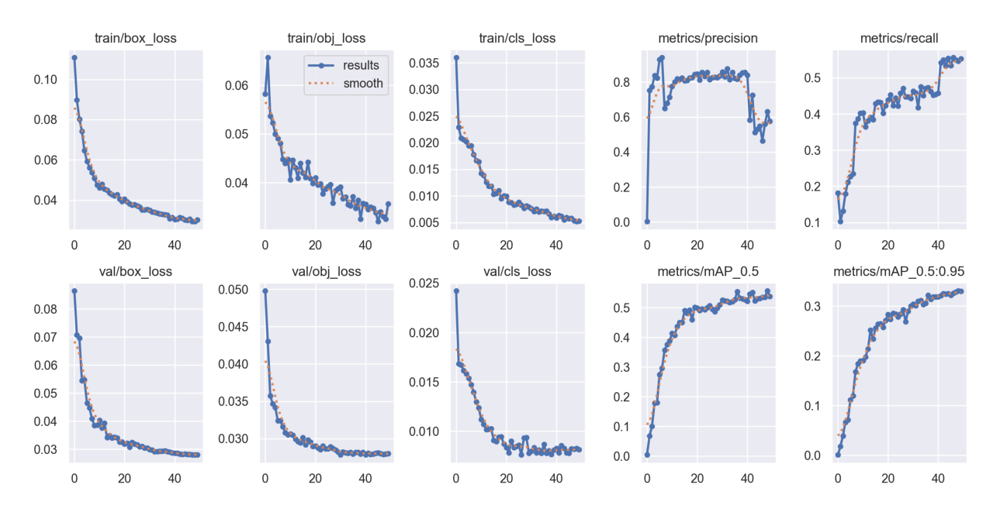

In [6]:
# Ergebnisse der Metriken
image_path = "runs/train/yolov5_dark_dataset/results.png"
plot_high_resolution_png(image_path, dpi=250)

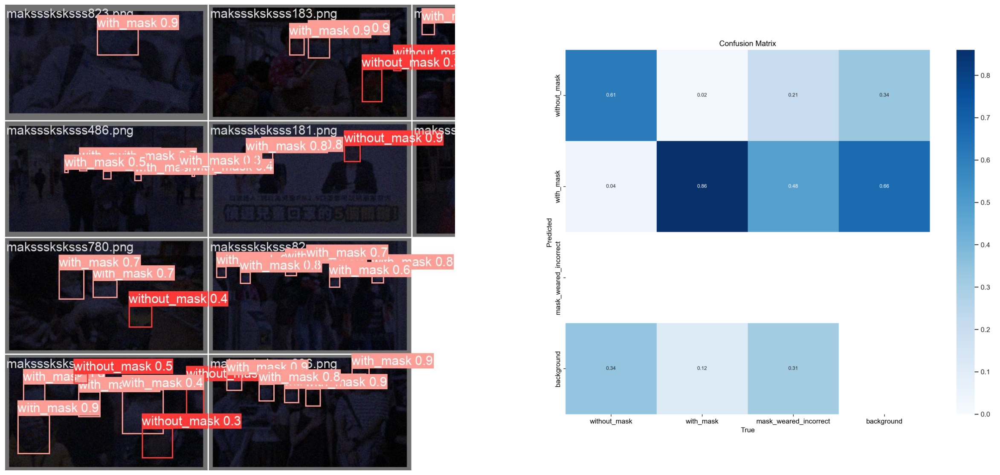

In [8]:
# Ergebnisse der Vorhersagen und Konfusionsmatrix
image_path_pred = "runs/train/yolov5_dark_dataset/val_batch1.jpg"
image_path_conf = "runs/train/yolov5_dark_dataset/confusion_matrix.png"
show_images_side_by_side(image_path_pred, image_path_conf)

### Resultate:

| Dark_Dataset  | Prozent                 |
|---------------|-------------------------|
| Recall        | 0.55                    |
| Precision     | 0.63                    |
| mAP_0.5       | 0.56                    |
| mAP_0.5:0.95  | 0.33                    |

### Fazit
Eine interessante Beobachtung ist der sprunghafte Wechsel zwischen Recall und Precision ab Epoche 40. Während die Precision abgenommen hat, ist der Recall gestiegen. Dieses Phänomen könnte auf den Einsatz des verdunkelten Datensatzes mit Augmentation zurückzuführen sein. Möglicherweise wurde der Datensatz durch die Verdunkelung so stark abgedunkelt, dass die Klassen "face_with_mask" und "face_without_mask" dem dunklen Hintergrund ähneln.

Die Analyse der Konfusionsmatrix unterstützt diese Vermutung. Es scheint, dass das Modell Personen mit 0.66 als "with_mask" zuweist, auch wenn es sich um den "background" handelt. Gleichzeitig werden Personen ohne Maske mit 0.34 fälschlicherweise als "background" klassifiziert.

Diese Beobachtungen deuten darauf hin, dass die Verdunkelung möglicherweise zu einer Vermischung der Klassen mit dem Hintergrund geführt hat, was zu einer Verschlechterung der Precision und einer Verbesserung des Recall geführt hat.

Um diese Herausforderung anzugehen, könnten weitere Datenanalysen durchgeführt und spezifischere Augmentationstechniken für den dunklen Datensatz angewendet werden. Außerdem könnte eine Neukalibrierung der Modellparameter in Betracht gezogen werden, um die Unterscheidung zwischen den Klassen und dem Hintergrund zu verbessern.
